In [1]:
#hide
%reload_ext autoreload
%autoreload 2

In [2]:
from alphadeep.rescore.percolator import Percolator
import os

In [3]:
#hide
from alphabase.io.psm_reader import psm_reader_provider
reader = psm_reader_provider.get_reader('alphapept', fdr=1, keep_decoy=True)
reader.import_file(os.path.expanduser('~/Workspace/Data/HeLa_500ng/HeLa_500ng.ms_data.hdf'))
select_col = 'spec_idx' #scan no
idx = reader.psm_df.groupby(select_col)['score'].idxmax()
psm_df = reader.psm_df.loc[idx]
psm_df.drop_duplicates([select_col,'sequence','mods'],inplace=True)
psm_df.sort_values(select_col)

,rt,spec_idx,query_id,score,precursor_mz,charge,raw_name,sequence,mods,mod_sites,decoy,nAA,rt_norm
74308,10.075488,3136,116023,30.743690,370.848036,3,HeLa_500ng,HFHETTPNK,,,0,9,0.084076
4813,10.064221,3137,46345,23.759086,387.678872,2,HeLa_500ng,HDYPSR,,,0,6,0.083982
124032,10.063720,3138,177283,26.872250,480.579816,3,HeLa_500ng,LFIHNHEQHHK,,,0,11,0.083978
22537,10.075908,3139,68990,23.491045,448.713123,2,HeLa_500ng,KVEDMMK,Oxidation@M,6,0,7,0.084079
67005,10.087931,3141,107020,27.624159,356.511542,3,HeLa_500ng,INHEGEVNR,,,0,9,0.084180
...,...,...,...,...,...,...,...,...,...,...,...,...,...
268822,108.174250,128500,239773,18.439210,1080.046971,2,HeLa_500ng,SEVRHQWLSETSVLGQMR,Oxidation@M,17,1,18,0.902670
222484,108.616336,128925,213187,27.497105,872.413137,2,HeLa_500ng,AMGIMNSFVNDIFER,,,0,15,0.906359
202586,119.684648,133371,215017,28.136146,882.404660,2,HeLa_500ng,LISWYDNEFGYSNR,,,0,14,0.998720
202588,119.684648,133374,215019,18.902502,882.404660,2,HeLa_500ng,LISWYDNEFGYSNR,,,0,14,0.998720


In [4]:
#hide
perc = Percolator()
perc_df = perc.extract_features(psm_df, 
    ms2_file_type='alphapept', 
    ms2_file_dict={
        'HeLa_500ng':
        os.path.expanduser('~/Workspace/Data/HeLa_500ng/HeLa_500ng.ms_data.hdf')
    }
)
perc_df

2022-01-12 10:13:36> Fine-tuning models ...
2022-01-12 10:13:36> Preparing for fine-tuning ...
2022-01-12 10:14:12> Fine-tuning ...
2022-01-12 10:19:22> Extracting alphadeep features ...
2022-01-12 10:23:30> Finish extracting features.


,rt,spec_idx,query_id,score,precursor_mz,charge,raw_name,sequence,mods,mod_sites,...,spc,frag_ratio,cos_bion,sa_bion,spc_bion,frag_ratio_bion,cos_yion,sa_yion,spc_yion,frag_ratio_yion
0,48.083985,52984,39192,20.222333,368.169493,2,HeLa_500ng,MMHFK,Acetyl@Protein N-term,0,...,0.961765,1.000000,0.894834,0.705412,0.976190,0.750000,0.935521,0.770138,0.880952,1.000000
1,48.083985,52879,39191,19.578986,368.169493,2,HeLa_500ng,MMHFK,Acetyl@Protein N-term,0,...,0.817647,1.000000,0.820647,0.612774,0.380952,0.750000,0.950334,0.798517,0.880952,1.000000
2,34.917818,35772,27439,21.542081,335.191208,2,HeLa_500ng,MHVIK,Acetyl@Protein N-term,0,...,0.807353,1.000000,0.991176,0.915365,0.511905,1.000000,0.918349,0.740954,0.880952,1.000000
3,29.086584,28372,21380,21.033489,631.286111,1,HeLa_500ng,MDAPR,Acetyl@Protein N-term,0,...,0.789706,1.000000,0.862296,0.661949,0.559524,0.750000,0.707930,0.500742,0.928571,1.000000
4,69.418941,80295,26864,20.282766,665.343669,1,HeLa_500ng,MFVAR,Acetyl@Protein N-term,0,...,0.447059,1.000000,0.840727,0.635744,0.261905,0.750000,0.846871,0.643033,0.797619,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89177,94.657040,111756,258196,26.228077,637.732925,5,HeLa_500ng,TFNQVEIKPEMIGHYLGEFSITYKPVK,Oxidation@M,11,...,0.441785,0.500000,0.720445,0.512125,0.236062,0.153846,0.944642,0.787181,0.644284,0.346154
89178,90.452143,106646,257002,34.391748,752.869056,4,HeLa_500ng,SCDEPLTPPPHSPTSMLQLIHDPVSPR,Carbamidomethyl@C,2,...,0.928534,0.730769,0.993456,0.927127,0.999915,0.192308,0.938618,0.775786,0.895629,0.615385
89179,79.127174,92443,257030,21.259003,1004.517591,3,HeLa_500ng,AAVLRTAMDALTFQLYQNSALPEGFQR,,,...,-0.264462,0.269231,0.007615,0.004848,-0.475199,0.153846,0.135847,0.086751,0.006275,0.192308
89180,96.908558,114599,256784,17.466505,995.554266,3,HeLa_500ng,TAFKFGVEVGFTLCLAVLLLNKSLSEK,Carbamidomethyl@C,14,...,-0.254380,0.192308,0.476460,0.316161,0.056476,0.153846,0.286108,0.184723,-0.446171,0.038462


In [5]:
#hide
df = perc_df.copy()
perc.cv_fold = 2
df = perc.re_score(df)
df

2022-01-12 10:23:30> 62889 target PSMs at 0.01 psm-level FDR
2022-01-12 10:23:30> [PERC] Iteration 1 of Percolator ...
2022-01-12 10:23:31> [PERC] 71729 target PSMs at 0.01 psm-level FDR
2022-01-12 10:23:31> [PERC] Iteration 2 of Percolator ...
2022-01-12 10:23:32> [PERC] 73290 target PSMs at 0.01 psm-level FDR
2022-01-12 10:23:32> [PERC] Iteration 3 of Percolator ...
2022-01-12 10:23:33> [PERC] 73956 target PSMs at 0.01 psm-level FDR
2022-01-12 10:23:33> [PERC] Iteration 4 of Percolator ...
2022-01-12 10:23:33> [PERC] 74229 target PSMs at 0.01 psm-level FDR
2022-01-12 10:23:33> [PERC] Iteration 5 of Percolator ...
2022-01-12 10:23:34> [PERC] 74403 target PSMs at 0.01 psm-level FDR
2022-01-12 10:23:34> [END] 74403 target PSMs at 0.01 psm-level FDR


,rt,spec_idx,query_id,score,precursor_mz,charge,raw_name,sequence,mods,mod_sites,...,spc,frag_ratio,cos_bion,sa_bion,spc_bion,frag_ratio_bion,cos_yion,sa_yion,spc_yion,frag_ratio_yion
0,44.586162,48444,251150,98.768397,1275.576245,2,HeLa_500ng,SPSEESAPTTSPESVSGSVPSSGSSGR,,,...,0.870127,0.961538,0.984798,0.888852,0.823316,0.615385,0.997971,0.959439,0.912704,0.884615
1,66.304855,76333,250117,97.623178,1253.553450,2,HeLa_500ng,HTQENCETWGVNGETGTLVDMK,Carbamidomethyl@C,6,...,0.828733,1.000000,0.992874,0.923956,0.736569,0.904762,0.996706,0.948313,0.916781,0.952381
2,104.896830,124342,253858,91.702177,1354.675852,2,HeLa_500ng,LTTPTYGDLNHLVSATMSGVTTCLR,Carbamidomethyl@C,23,...,0.817241,1.000000,0.969915,0.843446,0.532892,0.791667,0.952338,0.802656,0.954353,1.000000
3,43.152296,46601,250148,95.488343,1254.089483,2,HeLa_500ng,VGEVCHITCKPEYAYGSAGSPPK,Carbamidomethyl@C;Carbamidomethyl@C,5;9,...,0.665105,1.000000,0.969057,0.841217,0.544609,0.954545,0.994391,0.932541,0.773432,1.000000
4,56.433641,63712,254324,95.149144,1372.160484,2,HeLa_500ng,TNHIGHTGYLNTVTVSPDGSLCASGGK,Carbamidomethyl@C,22,...,0.799104,0.961538,0.962976,0.826225,0.788099,0.692308,0.994437,0.932820,0.815461,0.923077
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89177,95.230865,112508,178413,17.459240,723.876832,2,HeLa_500ng,APSLNMRKQEEK,Oxidation@M,6,...,-0.603665,0.454545,0.303491,0.196305,-0.297572,0.363636,0.044176,0.028133,-0.803501,0.181818
89178,106.805430,126883,206159,18.898326,834.845952,2,HeLa_500ng,ESGGEMESEGERESR,,,...,-0.683937,0.428571,0.131431,0.083914,-0.094417,0.285714,0.116275,0.074191,-0.950465,0.285714
89179,105.794384,125518,196917,18.878015,791.392834,2,HeLa_500ng,PEKVHSNCEVINR,Carbamidomethyl@C,8,...,-0.617781,0.500000,0.062277,0.039672,-0.608696,0.250000,0.161451,0.103235,-0.634783,0.333333
89180,106.372761,126351,192256,17.788474,771.893863,2,HeLa_500ng,LSQEEQLKSHESK,,,...,-0.530015,0.416667,0.463100,0.306526,-0.213043,0.250000,0.135086,0.086262,-0.764348,0.250000


In [6]:
df.sort_values('spec_idx')

,rt,spec_idx,query_id,score,precursor_mz,charge,raw_name,sequence,mods,mod_sites,...,spc,frag_ratio,cos_bion,sa_bion,spc_bion,frag_ratio_bion,cos_yion,sa_yion,spc_yion,frag_ratio_yion
45943,10.075488,3136,116023,30.743690,370.848036,3,HeLa_500ng,HFHETTPNK,,,...,0.942999,1.000000,0.968163,0.838929,0.976471,0.750000,0.938755,0.776039,0.842647,0.750000
67397,10.064221,3137,46345,23.759086,387.678872,2,HeLa_500ng,HDYPSR,,,...,0.909023,1.000000,0.994967,0.936099,1.000000,0.600000,0.997421,0.954267,0.903030,1.000000
56546,10.063720,3138,177283,26.872250,480.579816,3,HeLa_500ng,LFIHNHEQHHK,,,...,0.930957,1.000000,1.000000,1.000000,1.000000,0.100000,0.985803,0.892600,0.946617,1.000000
55617,10.075908,3139,68990,23.491045,448.713123,2,HeLa_500ng,KVEDMMK,Oxidation@M,6,...,0.652174,1.000000,0.995852,0.941994,0.125874,0.333333,0.998573,0.965985,1.000000,1.000000
49006,10.087931,3141,107020,27.624159,356.511542,3,HeLa_500ng,INHEGEVNR,,,...,0.862170,1.000000,0.950042,0.797921,0.822059,0.500000,0.967594,0.837487,0.908824,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87361,108.174250,128500,239773,18.439210,1080.046971,2,HeLa_500ng,SEVRHQWLSETSVLGQMR,Oxidation@M,17,...,-0.051914,0.294118,0.310395,0.200923,-0.154927,0.176471,0.246113,0.158307,0.094576,0.176471
35046,108.616336,128925,213187,27.497105,872.413137,2,HeLa_500ng,AMGIMNSFVNDIFER,,,...,0.618558,0.857143,0.989006,0.905515,0.407499,0.285714,0.983853,0.885440,0.788177,0.714286
70095,119.684648,133371,215017,28.136146,882.404660,2,HeLa_500ng,LISWYDNEFGYSNR,,,...,0.758217,0.769231,0.999843,0.988708,0.819145,0.153846,0.974614,0.856248,0.792137,0.769231
81201,119.684648,133374,215019,18.902502,882.404660,2,HeLa_500ng,LISWYDNEFGYSNR,,,...,0.417058,0.615385,0.999207,0.974652,0.819145,0.153846,0.754334,0.544080,0.241026,0.461538


In [7]:
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode
init_notebook_mode()
def plot_score_dist(df, x='ml_score'):
    fig = go.Figure()
    for decoy, df_group in df.groupby('decoy'):
        fig.add_histogram(x=df_group[x], name='decoy' if decoy else 'target')
    return fig

In [8]:
plot_score_dist(df, 'score')

In [9]:
plot_score_dist(df, 'ml_score')

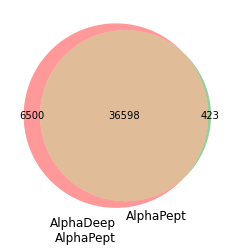

In [10]:
from matplotlib_venn import venn2
from alphadeep.rescore.fdr import calc_fdr_for_df
df_fdr = df[(df.fdr<0.01)&(df.decoy==0)]
ap_df = calc_fdr_for_df(df, 'score')
ap_df = ap_df[(ap_df.fdr<0.01)&(ap_df.decoy==0)]
venn2(
    [set(df_fdr.sequence.values), set(ap_df.sequence.values)],
    ['AlphaDeep\nAlphaPept','AlphaPept']
)